<a href="https://colab.research.google.com/github/Heo-JuYeong/data_analysis/blob/main/Welfare_Facility_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# 📘 [Project] 장병 복지시설 이용 실태 및 만족도 분석

---

## 1. 프로젝트 개요

국방의 최전선에서 헌신하고 있는 장병들에게 있어, 복무 환경은 곧 삶의 질과 직결됩니다. 특히 복지시설(PX, 독서실, 체력단련실, 상담실 등)은 단순한 편의 제공을 넘어, **심리적 안정감과 생활 만족도**에 깊이 연결되어 있습니다. 그러나 부대별로 복지 인프라의 분포나 이용 실태는 상이하며, 이에 따라 장병 개개인의 심리적 상태 또한 영향을 받을 수 있습니다.

이번 프로젝트는 이러한 문제의식에서 출발했습니다. 실제 군 부대별 위치 기반 데이터를 바탕으로, 다음 네 가지 핵심 요소를 중심으로 분석을 진행합니다:

- 복지시설의 **이용 접근성**
- 복지시설의 **이용 실태 (빈도, 종류 등)**
- 장병의 **복지 만족도**
- 장병의 **심리적 안정 상태**

이를 통해 다음과 같은 **실질적 분석 목표**를 달성하고자 합니다:

> 🔹 **지역 간 복지 제공 격차 파악**  
> 🔹 **심리 불균형 가능성이 높은 대상 탐색**  
> 🔹 **생활환경(예: 개인 공간 여부)에 따른 차이 해석**  
> 🔹 **데이터 기반 복지정책 개선 방향 제시**

이 과제에서는 분석 결과만이 중요한 것이 아닙니다. 데이터를 해석하고 시각화하고, 그것을 통해 의미 있는 **정책적 제안**으로 확장하는 능력을 함께 훈련할 것입니다.

분석의 결과는 단순한 수치에 머무르지 않고, **실제 복무 중인 장병들에게 더 나은 환경을 제공할 수 있는 논리적 근거**가 될 수 있습니다.

따라서 이 프로젝트를 통해 여러분은 다음과 같은 역량을 기르게 됩니다:

- Pandas, Seaborn, Folium을 활용한 실제 분석 흐름 이해
- EDA + 통계검정 + 지도 시각화 + 인사이트 도출이라는 **전체 사이클 경험**
- "내가 도출한 인사이트가 실무에 어떤 의미를 줄 수 있을까?"를 고민을 경험

이제, 실제 데이터를 바탕으로 군 복지시설에 숨어 있는 이야기를 함께 찾아가봅시다.



---

## 2. 분석 흐름 요약

이 노트북은 아래와 같은 순서로 분석을 진행합니다:

1. **데이터 불러오기 및 구조 확인**: 데이터의 전체 구조를 파악하고 주요 변수들을 이해합니다.
2. **데이터 전처리**: 결측치 처리, 이상치 탐색, 타입 정리 등의 기초 정비를 수행합니다.
3. **기초 EDA**: 주요 범주(계급, 시설, 지역 등)별 이용 현황과 만족도를 시각화합니다.
4. **파생 변수 생성**: 접근성 점수, 기대 심리 안정도 등 유용한 파생변수를 생성합니다.
5. **통계 분석**: 생활환경 유형에 따른 차이 분석(t-검정), 변수 간 독립성 분석(카이제곱 검정)을 수행합니다.
6. **지도 시각화(Folium)**: 실제 위치 정보를 바탕으로 공간적 불균형을 시각화합니다.
7. **최종 인사이트 정리**: 종합 분석 결과를 바탕으로 정책적 제안 도출 및 개인 리포트 과제 작성으로 마무리합니다.

📦 **데이터 개요 요약**
- 약 5,000건의 장병 복지시설 설문조사 데이터
- 위도/경도 포함 → 실제 부대 위치 시각화 가능
- 주요 분석 변수: region, unit_code, rank, facility_type, satisfaction_score, mental_wellbeing_score, has_private_space, distance_to_facility, facility_usage 등
- 통계 분석과 지도 시각화에 모두 적합하도록 설계됨

| 컬럼명 | 설명 | 데이터 타입 | 값 예시 | 분석 목적 / 지침 |
| --- | --- | --- | --- | --- |
| soldier_id | 장병 ID | 문자열 | S2024070012 | 고유 식별자 (분석 제외) |
| unit_code | 부대 코드 | 문자열 | 11사단, 7사단 | 분석 단위로 사용 |
| region | 권역 구분 | 문자열 | 강원권, 수도권, 영남권 | 지역 기반 시각화 |
| lat, lon | 위도 / 경도 | 실수형 | 38.149, 127.304 *(11사단 기준)* | 실제 부대 위치 기반 Folium 시각화 |
| rank | 계급 | 범주형 | 이병, 병장 | 계급별 행동 패턴 비교 |
| facility_type | 복지시설 종류 | 범주형 | PX, 체력단련실, 독서실 등 | 5종 이상 구성 |
| facility_usage | 시설 이용 여부 | 범주형 (0/1) | 1 = 이용 | 카이제곱 분석용 |
| usage_frequency_per_week | 주당 이용 횟수 | 정수형 | 3 | 이용 강도 측정 |
| satisfaction_score | 만족도 점수 (1~5) | 정수형 | 4 | 통계 검정, 상관분석 |
| distance_to_facility | 생활관-시설 거리 (m) | 실수형 | 120.5 | 접근성 점수화 기반 |
| has_private_space | 생활공간 유형 | 범주형 | 격리형, 침상형 | t-검정 비교 가능 |
| mental_wellbeing_score | 심리 안정도 (1~10) | 정수형 | 7 | 종속 변수 역할 |
| date | 설문 일자 | 날짜형 | 2024-10-02 | 시간 흐름 분석 가능 |

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/Colab Notebooks/소집교육/미니프로젝트
%ls

/content/drive/MyDrive/Colab Notebooks/소집교육/미니프로젝트
Military_Welfare_Facilities.csv  Welfare_Facility_Analysis.ipynb


# 📊 장병 복지시설 이용 실태 분석

In [4]:
!pip install koreanize_matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 71.4 MB/s eta 0:00:00


In [5]:
import koreanize_matplotlib

In [6]:
# 라이브러리 불러오기
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from scipy.stats import ttest_ind, chi2_contingency, pearsonr
import warnings
warnings.filterwarnings('ignore')

In [18]:
# 데이터 불러오기
df = pd.read_csv('./Military_Welfare_Facilities.csv')
df['date'] = pd.to_datetime(df['date'])

## 🔍 1. 데이터 구조 확인 및 전처리
- 날짜 및 범주형 처리
- 이상치 확인

In [19]:
# 범주형 처리 및 기본 확인
cat_cols = ['unit_code', 'region', 'rank', 'facility_type', 'has_private_space']
for col in cat_cols:
    df[col] = df[col].astype('category')

print("✅ 데이터 구조:")
df.info()

✅ 데이터 구조:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11000 entries, 0 to 10999
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   soldier_id                 11000 non-null  object        
 1   unit_code                  11000 non-null  category      
 2   region                     11000 non-null  category      
 3   lat                        11000 non-null  float64       
 4   lon                        11000 non-null  float64       
 5   rank                       11000 non-null  category      
 6   facility_type              11000 non-null  category      
 7   facility_usage             11000 non-null  int64         
 8   usage_frequency_per_week   11000 non-null  int64         
 9   satisfaction_score         11000 non-null  int64         
 10  distance_to_facility       11000 non-null  float64       
 11  has_private_space          11000 non-null  category      

In [17]:
df.head()

,soldier_id,unit_code,region,lat,lon,rank,facility_type,facility_usage,usage_frequency_per_week,satisfaction_score,distance_to_facility,has_private_space,mental_wellbeing_score,date,facility_access_score,expected_mental_score,mental_gap_score,expected_mental_score_adj,expected_mental_score_v4
0,S20240700001,17사단,전라권,36.517251,127.006332,이병,노래방,0,2,6,153.9,격리형,1,2024-09-13,-53.9,1.6525,-0.6525,2.15,2.160000
1,S20240700002,14사단,전라권,36.227541,127.840048,일병,독서실,0,2,6,343.1,침상형,1,2024-11-05,-243.1,-3.0775,4.0775,-2.58,-2.880000
2,S20240700003,23사단,전라권,37.038748,127.239173,이병,체력단련실,1,0,5,385.8,격리형,1,2024-09-10,-285.8,-4.6450,5.6450,-4.15,-3.571377
3,S20240700004,25사단,수도권,38.416642,128.533748,이병,독서실,0,2,3,308.3,침상형,3,2024-12-02,-208.3,-3.7075,6.7075,-3.71,-2.770103
4,S20240700005,21사단,수도권,37.097390,127.730811,일병,노래방,1,4,3,121.3,침상형,2,2024-08-09,-21.3,0.9675,1.0325,0.97,1.230000


In [24]:
df.columns

Index(['soldier_id', 'unit_code', 'region', 'lat', 'lon', 'rank',
       'facility_type', 'facility_usage', 'usage_frequency_per_week',
       'satisfaction_score', 'distance_to_facility', 'has_private_space',
       'mental_wellbeing_score', 'date', 'facility_access_score',
       'expected_mental_score', 'mental_gap_score',
       'expected_mental_score_adj', 'expected_mental_score_v4'],
      dtype='object')

In [9]:
# 기본 통계 확인
df.describe(include='all')

,soldier_id,unit_code,region,lat,lon,rank,facility_type,facility_usage,usage_frequency_per_week,satisfaction_score,distance_to_facility,has_private_space,mental_wellbeing_score,date,facility_access_score,expected_mental_score,mental_gap_score,expected_mental_score_adj,expected_mental_score_v4
count,11000,11000,11000,11000.000000,11000.000000,11000,11000,11000.000000,11000.000000,11000.000000,11000.000000,11000,11000.000000,11000,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000
unique,11000,15,5,NaN,NaN,4,5,NaN,NaN,NaN,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,S20240711000,23사단,충청권,NaN,NaN,상병,독서실,NaN,NaN,NaN,NaN,침상형,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,774,2219,NaN,NaN,2818,2324,NaN,NaN,NaN,NaN,5573,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,37.005726,128.014970,NaN,NaN,0.501545,2.460273,3.417273,300.390618,NaN,2.127182,2024-09-29 11:55:01.527272960,-200.390618,-3.301126,1.627614,-2.987308,-2.927116
min,NaN,NaN,NaN,35.500157,126.501745,NaN,NaN,0.000000,0.000000,1.000000,100.000000,NaN,1.000000,2024-07-01 00:00:00,-399.900000,-9.500000,-3.160000,-9.500000,-10.060000
25%,NaN,NaN,NaN,36.252903,127.276596,NaN,NaN,0.000000,2.000000,2.000000,201.275000,NaN,1.000000,2024-08-15 00:00:00,-299.925000,-5.760000,0.450000,-5.480000,-5.534524
50%,NaN,NaN,NaN,37.000653,128.015438,NaN,NaN,1.000000,2.000000,3.000000,299.450000,NaN,2.000000,2024-09-28 00:00:00,-199.450000,-3.300000,0.980414,-2.990000,-2.838181
75%,NaN,NaN,NaN,37.759142,128.762646,NaN,NaN,1.000000,3.000000,5.000000,399.925000,NaN,2.000000,2024-11-14 00:00:00,-101.275000,-0.840000,1.450696,-0.500000,-0.285340
max,NaN,NaN,NaN,38.499901,129.499944,NaN,NaN,1.000000,7.000000,7.000000,499.900000,NaN,10.000000,2024-12-31 00:00:00,0.000000,3.460000,17.302844,4.460000,4.981719


## 🧮 2. 파생변수 생성 및 탐색
- 접근성 점수, 기대 심리 점수, 심리 갭 점수

In [10]:
# 파생변수 생성
df['facility_access_score'] = 100 - df['distance_to_facility']
df['expected_mental_score'] = (df['satisfaction_score'] + df['facility_access_score'] / 20) / 2
df['mental_gap_score'] = df['mental_wellbeing_score'] - df['expected_mental_score']

## 📈 3. 시각화 분석
- 시설 이용률, 계급별 이용 횟수 등

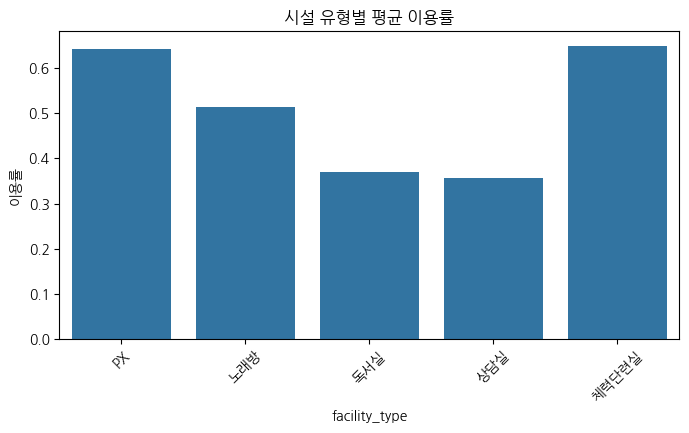

In [11]:
# 시설 이용률
plt.figure(figsize=(8, 4))
sns.barplot(x='facility_type', y='facility_usage', data=df, ci=None)
plt.title('시설 유형별 평균 이용률')
plt.ylabel('이용률')
plt.xticks(rotation=45)
plt.show()

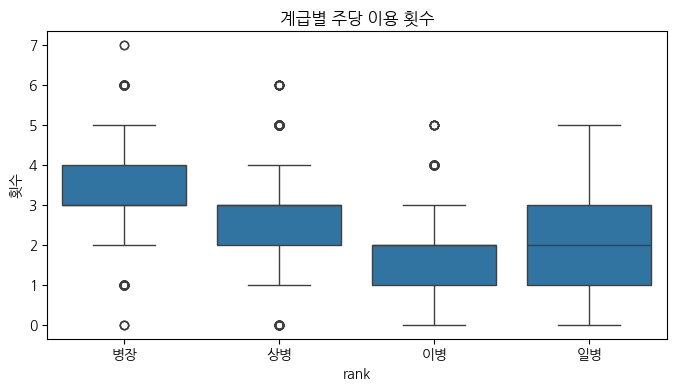

In [12]:
# 계급별 평균 이용 횟수
plt.figure(figsize=(8, 4))
sns.boxplot(x='rank', y='usage_frequency_per_week', data=df)
plt.title('계급별 주당 이용 횟수')
plt.ylabel('횟수')
plt.show()

## 🔬 4. 통계 분석
- 카이제곱 검정
- 독립 t-검정
- 상관계수 분석

In [13]:
# 카이제곱 검정: has_private_space vs facility_usage
table = pd.crosstab(df['facility_usage'], df['has_private_space'])
chi2, p, _, _ = chi2_contingency(table)
print(f"카이제곱 통계량: {chi2:.2f}, p-value: {p:.4f}")

카이제곱 통계량: 0.01, p-value: 0.9275


In [14]:
# 독립 t-검정: mental_gap_score
iso = df[df['has_private_space'] == '격리형']['mental_gap_score']
open = df[df['has_private_space'] == '침상형']['mental_gap_score']
t, p = ttest_ind(iso, open)
print(f"t-검정 결과: 통계량 = {t:.2f}, p-value = {p:.4f}")

t-검정 결과: 통계량 = 2.84, p-value = 0.0045


In [15]:
# 만족도 vs 심리 안정도 상관관계
r, pval = pearsonr(df['satisfaction_score'], df['mental_wellbeing_score'])
print(f"상관계수: {r:.2f}, p-value: {pval:.4f}")

상관계수: 0.06, p-value: 0.0000


## 🗺️ 5. Folium 시각화
- 심리갭 점수 > 2 이상 장병 지도 표시

In [16]:
# 지도 시각화
map = folium.Map(location=[37.5, 127.5], zoom_start=7)
cluster = MarkerCluster().add_to(map)

for _, row in df[df['mental_gap_score'] > 2].iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=5,
        popup=f"{row['unit_code']} - gap: {row['mental_gap_score']:.2f}",
        color='crimson',
        fill=True,
        fill_opacity=0.7
    ).add_to(cluster)

map

<br>

## ✅ 6. 분석 정리 및 인사이트
```
- 격리형 생활관이 심리 안정에 긍정적 영향 가능성
- PX, 체력단련실의 이용률 높음 → 시설 강화 우선 대상
- 심리갭 점수 높은 인원은 특정 부대/지역에 집중됨 → 선제적 대응 가능

> 이 분석은 복지정책 설계, 상담자 배치 전략, 시설 리모델링 타겟 선정 등에 활용 가능
```



<br>

## ✅ 7. 본인 업무 적용 방안


**1. 자신의 소속 / 업무 역할 간단 소개**

```
  공군군수사83창 체계개발공장 / 임베디드하드웨어개발담당 / 직책명은 하드웨어 개발이나 실 업무는 소프트웨어 개발입니다.
  군 내에서 필요로 하는 SW에 대한 소요제기 또는 자체소요제기에 맞추어 소프트웨어를 개발합니다.
  (완료된 주요 프로젝트 : 화학자동경보기 무선통합체계, 차기 주요 프로젝트 : AI 활용 창정비를 위한 열화상이미지 분석)
```


**2. 해당 데이터 분석 결과 중 관심 있게 본 인사이트 2~3가지 선정**

```
  교육 이후 근무지에서 진행될 <AI 활용 창정비를 위한 열화상이미지 분석> 프로젝트는 창 내에 입고되는 여러 고장보드(회로기판)의
  발열 상태를 열화상카메라로 촬영하여 기존 데이터와 비교하는 것으로 고장 부위 및 원인 등을 판단하기 위한 프로젝트입니다.
  
  따라서 해당 데이터를 직접적으로 이용하는 것에는 어려움이 있기 때문에, 주어진 데이터를 보고 개인적으로 분석 또는 시각화 해보고
  싶은 내용들을 정리해 보았습니다.
```


**3. 해당 인사이트가 본인의 실무와 어떻게 연결될 수 있는지 설명**

```
  예: 부대 재배치 검토 시 고려사항 / 생활관 리모델링 계획 반영 / 상담 인력 배치 요청 등
```

**4. 구체적인 실행 방안 또는 제안 초안**

```
  예: "격오지 부대의 PX 접근성 개선을 위한 이동형 복지시설 시범사업 추진 제안"
  ```

<br>

## ✅ 8. 제출 파일 생성
```
- 파일명 : [미니프로젝트]장병복지시설만족도분석_{이름}.pdf
- 방법 : 상단 '파일' 탭의 '인쇄'  -> 인쇄 창 뜨면 우측의 '대상' 에서 'pdf로 저장' 선택 후 '저장' 하여 파일 제출
```